In [302]:
from rich.console import Console
from rich.text import Text

# Создание объекта консоли
console = Console()

# Создание заголовка
title = Text("Анализ рождаемости России, США, Китая и Индии", style="bold blue")
console.print(title)

# Создание текста
text = Text("Проект посвящён анализу зависимости между рождаемостью и ВВП, социальными отчислениями, рынком недвижимости выбранных стран. Проект разделён на этапы: скачивание данных с сайта World bank, группировка данных для упрощения навигации, визуализация данных, корреляционный анализ, регрессионный анализ и подведение итогов.\nГипотеза-1: рост ВВП приводит к увеличению дозодов экономических агентов и расширению возможностей в сфере образования и профессиональной карьере, в результате чего семьи принимают решение в сторону сокращения количества детей.\nГипотеза-2: располагаемый доход домохозяйств зависит от социальных отчислений. Рост объёмов социальных отчислений негативно влияет на уровень рождаемости.\nГипотеза-3: рост цен на недвижимость приводит к снижению доступности жилья, что негативно сказывается на рождаемости.\nДля анализа были выбраны такие страны, как России, США, Китай, Индия, так как для них на сайте World Bank данные представлены в общедоступном формате.")
console.print(text)



Анализ рождаемости России, США, Китая и Индии

Проект посвящён анализу зависимости между рождаемостью и ВВП, социальными отчислениями, рынком недвижимости 
выбранных стран. Проект разделён на этапы: скачивание данных с сайта World bank, группировка данных для упрощения 
навигации, визуализация данных, корреляционный анализ, регрессионный анализ и подведение итогов.
Гипотеза-1: рост ВВП приводит к увеличению дозодов экономических агентов и расширению возможностей в сфере 
образования и профессиональной карьере, в результате чего семьи принимают решение в сторону сокращения количества 
детей.
Гипотеза-2: располагаемый доход домохозяйств зависит от социальных отчислений. Рост объёмов социальных отчислений 
негативно влияет на уровень рождаемости.
Гипотеза-3: рост цен на недвижимость приводит к снижению доступности жилья, что негативно сказывается на 
рождаемости.
Для анализа были выбраны такие страны, как России, США, Китай, Индия, так как для них на сайте World Bank данные 
представлены в общедоступном формате.

In [303]:
import geopandas as gpd
import matplotlib.pyplot as plt
from colorama import Fore, Style
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from ydata_profiling import ProfileReport

C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\625632639.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\625632639.py:31: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = countries[countries['name'] == country]['geometry'].centroid
C:\Users\fedor\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\text.py:1461: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(x))
C:\Users\fedor\AppData\Local\Programs\Pyt

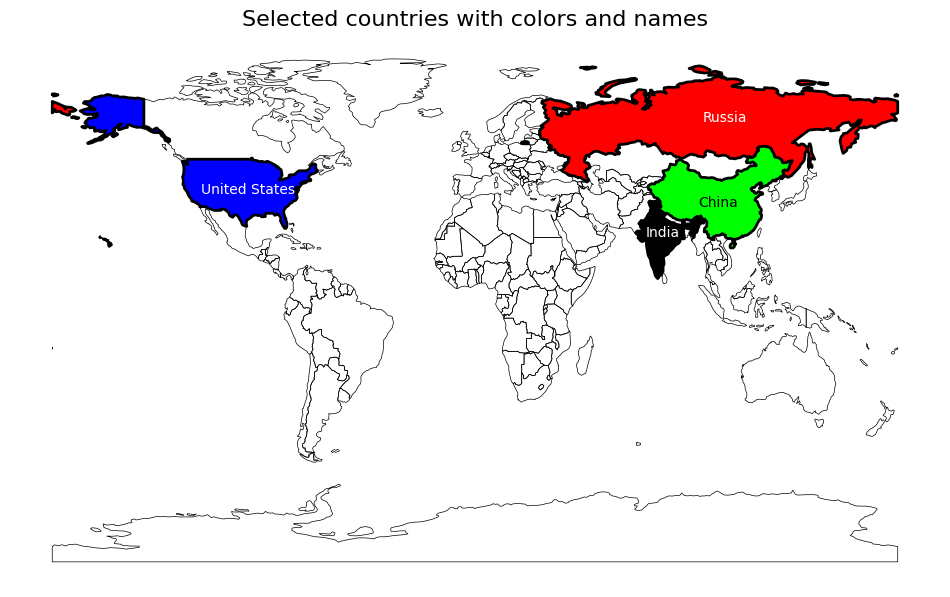

In [304]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Выбор только стран Россия, США, Китай и Индия
countries = world[(world['name'] == 'Russia') | (world['name'] == 'United States of America') | (world['name'] == 'China') | (world['name'] == 'India')]

# Отображение карты с разными цветами и названиями для каждой страны
fig, ax = plt.subplots(figsize=(12, 8))
world.boundary.plot(ax=ax, color='black', linewidth=0.5)

for country in countries['name']:
    color = ''
    if country == 'Russia':
        color = 'red'
        text_color = 'white'
        text_shift = (0, 0)
    elif country == 'United States of America':
        color = 'blue'
        text_color = 'white'
        text_shift = (-7, -18)
    elif country == 'China':
        color = 'lime'
        text_color = 'black'
        text_shift = (-15, -8)
    elif country == 'India':
        color = 'black'
        text_color = 'white'
        text_shift = (-12, -1)
    
    countries[countries['name'] == country].plot(ax=ax, color=color, edgecolor='black', linewidth=2)
    
    centroid = countries[countries['name'] == country]['geometry'].centroid
    ax.annotate(country, xy=(centroid.x, centroid.y), xytext=text_shift, textcoords="offset points", color=text_color)

plt.title('Selected countries with colors and names', fontsize=16)
plt.axis('off')
plt.show()


In [305]:
header = "Часть 1. Скачивание данных"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"

print(formatted_header)


Часть 1. Скачивание данных


In [306]:
df_Russia = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/Russia_gdp.csv', delimiter=',')
new_row_name = 'Russia GDP' 
df_Russia = df_Russia.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
print(df_Russia)



                   2000         2001         2002         2003         2004  \
Russia GDP 259710142197 306602070620 345470494418 430347420185 591016690732   

                   2005         2006          2007          2014  \
Russia GDP 764015973481 989932071353 1299703478482 2059241589895   

                    2015          2016           2017          2018  \
Russia GDP 1363482182198 1276786350881  1574199360089 1657328773461   

                    2019          2020          2021          2022  2023  
Russia GDP 1693115002708 1493075894362 1836892075548 2240422427459   NaN  


In [307]:
df_USA = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/USA_gdp.csv', delimiter=',')
new_row_name = 'USA GDP' 
df_USA = df_USA.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
print(df_USA)



                   2000            2001            2002            2003  \
USA GDP  10250947997000  10581929774000  10929112955000  11456442041000   

                   2004            2005            2006            2007  \
USA GDP  12217193198000  13039199193000  13815586948000  14474226905000   

                   2014            2015            2016            2017  \
USA GDP  17550680174000  18206020741000  18695110842000  19477336549000   

                   2018            2019            2020            2021  \
USA GDP  20533057312000  21380976119000  21060473613000  23315080560000   

                   2022  
USA GDP  25439700000000  


In [308]:
df_China = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/China_gdp.csv', delimiter=',')
new_row_name = 'China GDP' 
df_China = df_China.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
print(df_China)


                   2000          2001          2002          2003  \
China GDP 1211331651830 1339400897153 1470557654824 1660280543871   

                   2004          2005          2006          2007  \
China GDP 1955346768758 2285961149904 2752118657222 3550327803025   

                    2014           2015           2016           2017  \
China GDP 10475624944290 11061572618595 11233313730288 12310491333981   

                    2018           2019            2020           2021  \
China GDP 13894907857926 14279968506243  14687744162801 17820459508852   

                    2022  
China GDP 17963171479205  


In [309]:
df_India = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/India_gdp.csv', delimiter=',')
new_row_name = 'India GDP' 
df_India = df_India.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
df_India = df_India.replace("..", np.nan)
df_India = df_India.ffill()
print(df_India)

                  2000         2001         2002         2003         2004  \
India GDP 468394937256 485441014539 514937948874 607699285436 709148514816   

                  2005         2006          2007          2014          2015  \
India GDP 820381595511 940259888794 1216736438842 2039126479228 2103588360066   

                   2016          2017          2018          2019  \
India GDP 2294796885683 2651474262735 2702929641707 2835606256616   

                   2020          2021          2022  2023  
India GDP 2671595405987 3150306839142 3416645826053   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\1042764518.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_India = df_India.replace("..", np.nan)


In [310]:
df_Russia_birth = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/Russia_birth.csv', delimiter=',')
new_row_name = 'Russia birth rate' 
df_Russia_birth = df_Russia_birth.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.1f' % x)
df_Russia_birth = df_Russia_birth.replace("..", np.nan)
df_Russia_birth = df_Russia_birth.ffill()
print(df_Russia_birth)

                   2000  2001  2002  2003  2004  2005  2006  2007  2014  2015  \
Russia birth rate   8.7     9   9.7  10.2  10.4  10.2  10.3  11.3  13.3  13.3   

                   2016  2017  2018  2019  2020  2021  2022  2023  
Russia birth rate  12.9  11.5  10.9  10.1   9.8   9.6   8.9   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\509465957.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_Russia_birth = df_Russia_birth.replace("..", np.nan)


In [311]:
df_USA_birth = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/USA_birth.csv', delimiter=',')
new_row_name = 'USA birth rate' 
df_USA_birth = df_USA_birth.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.1f' % x)
print(df_USA_birth)




                2000  2001  2002  2003  2004  2005  2006  2007  2014  2015  \
USA birth rate  14.4  14.1    14  14.1    14    14  14.3  14.3  12.5  12.4   

                2016  2017  2018  2019  2020  2021  2022  
USA birth rate  12.2  11.8  11.6  11.4  10.9    11    11  


In [312]:
df_China_birth = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/China_birth.csv', delimiter=',')
new_row_name = 'China birth rate' 
df_China_birth = df_China_birth.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.1f' % x)
print(df_China_birth)


                  2000  2001  2002  2003  2004  2005  2006  2007  2014  2015  \
China birth rate  14.0  13.4  12.9  12.4  12.3  12.4  12.1  12.1  13.8  12.0   

                  2016  2017  2018  2019  2020  2021  2022  
China birth rate  13.6  12.6  10.9  10.4   8.5   7.5   6.8  


In [313]:
df_India_birth = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/India_birth.csv', delimiter=',')
new_row_name = 'India birth rate' 
df_India_birth = df_India_birth.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.1f' % x)
df_India_birth = df_India_birth.replace("..", np.nan)
df_India_birth = df_India_birth.ffill()
print(df_India_birth)

                  2000  2001  2002  2003  2004  2005  2006  2007  2014  2015  \
India birth rate  27.0  26.7  26.1  25.4  24.7  23.9  23.2  22.7  19.0  18.8   

                  2016  2017  2018  2019  2020  2021  2022  2023  
India birth rate  18.5  17.9  17.7  17.0  16.6  16.4  16.3   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\3241477275.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_India_birth = df_India_birth.replace("..", np.nan)


In [314]:
df_Russia_social = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/Russia_social.csv', delimiter=',')
new_row_name = 'Russia social' 
df_Russia_social = df_Russia_social.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
df_Russia_social = df_Russia_social.replace("..", np.nan)
df_Russia_social = df_Russia_social.ffill()

print(df_Russia_social)

                       2000          2001           2002           2003  \
Russia social  519625000000  620084000000  1275330000000  1107845224300   

                        2004           2005           2006           2007  \
Russia social  1263919015500  1188972400000  1513400000000  2004000000000   

                       2014          2015           2016           2017  \
Russia social 5623636719084 5482602523049  6887014000000  6464390000000   

                        2018           2019           2020           2021  \
Russia social  7507623000000  8096548000000  8303273000000  8783554000000   

               2022  2023  
Russia social   NaN   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\672751810.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_Russia_social = df_Russia_social.replace("..", np.nan)


In [315]:
df_USA_social = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/USA_social.csv', delimiter=',')
new_row_name = 'USA social' 
df_USA_social = df_USA_social.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
print(df_USA_social)

                    2000          2001          2002          2003  \
USA social  659300000000  723262000000  739425000000  763276000000   

                    2004          2005          2006          2007  \
USA social  808978900000  853397000000  905682000000  947297000000   

                     2014           2015           2016           2017  \
USA social  1140055000000  1190781100000  1224406000000  1284313400000   

                     2018           2019           2020           2021  \
USA social  1346608700000  1409292300000  1434565000000  1541138100000   

                     2022  
USA social  1684966500000  


In [316]:
df_China_social = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/China_social.csv', delimiter=',')
new_row_name = 'China social' 
df_China_social = df_China_social.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
df_China_social = df_China_social.replace("..", np.nan)
df_China_social = df_China_social.ffill()
print(df_China_social)



              2000  2001  2002  2003  2004  2005  2006  2007           2014  \
China social   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN  3003895310100   

                      2015           2016           2017           2018  \
China social 3381464321313  3647922000000  4241766000000  5754500000000   

                       2019           2020           2021  2022  
China social  5999147000000  4922465000000  6910085000000   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\928550438.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_China_social = df_China_social.replace("..", np.nan)


In [317]:
df_India_social = pd.read_csv('C:/Users/Fedor/OneDrive/Документы/GDP/India_social.csv', delimiter=',')
new_row_name = 'India social' 
df_India_social = df_India_social.rename(index={0: new_row_name})
pd.set_option('display.float_format', lambda x: '%.0f' % x)
df_India_social = df_India_social.replace("..", np.nan)
df_India_social = df_India_social.ffill()
print(df_India_social)

                    2000        2001        2002        2003        2004  \
India social  1260000000  9900000000  6820000000  4690000000  9150000000   

                    2005        2006        2007         2014         2015  \
India social  8220000000  8220000000  7790000000  13481300000  16390000000   

                     2016         2017         2018  2019  2020  2021  2022  \
India social  17040000000  28280000000  28250000000   NaN   NaN   NaN   NaN   

              2023  
India social   NaN  


C:\Users\fedor\AppData\Local\Temp\ipykernel_21256\3686271791.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_India_social = df_India_social.replace("..", np.nan)


In [318]:
df_Russia_housing = pd.read_excel('C:/Users/Fedor/OneDrive/Документы/Russia housing index.xlsx')
dates = df_Russia_housing['Date']
values = df_Russia_housing['Value']
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_Russia_housing['Year'] = df_Russia_housing['Date'].str.split('-').str[0]
df_Russia_housing= df_Russia_housing.drop('Date', axis=1)
new_order = ['Year', 'Value']
df_Russia_housing = df_Russia_housing.reindex(columns=new_order)
df_Russia_housing.set_index('Year', inplace=True)
print(df_Russia_housing)


      Value
Year       
2000  13.10
2001  25.10
2002  22.50
2003  18.80
2004  18.50
2005  17.50
2006  34.67
2007  35.91
2008  18.36
2009  -4.35
2010  -2.05
2011   5.82
2012  10.27
2013   7.37
2014   4.25
2015   1.91
2016  -3.45
2017  -1.68
2018   2.13
2019   5.37
2020   5.14
2021  16.24
2022 119.78
2023 107.55


In [319]:
df_USA_housing = pd.read_excel('C:/Users/Fedor/OneDrive/Документы/USA housing index.xlsx')
dates = df_USA_housing['Date']
values = df_USA_housing['Value']
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_USA_housing['Year'] = df_USA_housing['Date'].str.split('-').str[0]
df_USA_housing= df_USA_housing.drop('Date', axis=1)
new_order = ['Year', 'Value']
df_USA_housing = df_USA_housing.reindex(columns=new_order)
df_USA_housing.set_index('Year', inplace=True)

print(df_USA_housing)

      Value
Year       
2014  56.17
2015  58.58
2016  60.83
2017  67.67
2018  67.08
2019  66.08
2020  76.17
2021  81.17
2022  59.00
2023  44.33


In [320]:
df_China_housing = pd.read_excel('C:/Users/Fedor/OneDrive/Документы/China housing index.xlsx')
dates = df_China_housing['Date']
values = df_China_housing['Value']
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_China_housing['Year'] = df_China_housing['Date'].str.split('-').str[0]
df_China_housing= df_China_housing.drop('Date', axis=1)
new_order = ['Year', 'Value']
df_China_housing = df_China_housing.reindex(columns=new_order)
df_China_housing.set_index('Year', inplace=True)

print(df_China_housing)

      Value
Year       
2014  -0.78
2015  -3.16
2016   8.08
2017   8.89
2018   6.48
2019   9.26
2020   5.27
2021   4.07
2022  -0.21
2023  -0.38


In [321]:
df_India_housing = pd.read_excel('C:/Users/Fedor/OneDrive/Документы/India housing index.xlsx')
dates = df_India_housing['Date']
values = df_India_housing['Value']
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_India_housing['Year'] = df_India_housing['Date'].str.split('-').str[0]
df_India_housing= df_India_housing.drop('Date', axis=1)
new_order = ['Year', 'Value']
df_India_housing = df_India_housing.reindex(columns=new_order)
df_India_housing.set_index('Year', inplace=True)

print(df_India_housing)

      Value
Year       
2011 189.33
2012 200.50
2013 114.00
2014  82.00
2015  88.00
2016  96.00
2017  98.75
2018 104.75
2019 108.50
2020 106.00
2021 105.75
2022 109.75
2023 112.00


In [322]:
header = "Часть 2. Группировка и форматирование"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"

print(formatted_header)


Часть 2. Группировка и форматирование


In [323]:
df_GDP_combined = pd.concat([df_Russia, df_USA, df_China, df_India])
print(df_GDP_combined)

                        2000              2001              2002  \
Russia GDP   259710142196.94   306602070620.50   345470494417.86   
USA GDP    10250947997000.00 10581929774000.00 10929112955000.00   
China GDP   1211331651829.85  1339400897153.44  1470557654824.11   
India GDP    468394937255.80   485441014538.64   514937948874.21   

                        2003              2004              2005  \
Russia GDP   430347420184.89   591016690732.39   764015973481.11   
USA GDP    11456442041000.00 12217193198000.00 13039199193000.00   
China GDP   1660280543870.95  1955346768757.64  2285961149904.26   
India GDP    607699285436.05   709148514815.79   820381595510.64   

                        2006              2007              2014  \
Russia GDP   989932071352.54  1299703478481.65  2059241589895.01   
USA GDP    13815586948000.00 14474226905000.00 17550680174000.00   
China GDP   2752118657221.64  3550327803024.69 10475624944290.10   
India GDP    940259888794.35  1216736438842.41

In [324]:
df_birth_combined = pd.concat([df_Russia_birth, df_USA_birth, df_China_birth, df_India_birth])
print(df_birth_combined)


                   2000  2001  2002  2003  2004  2005  2006  2007  2014  2015  \
Russia birth rate  8.70  9.00  9.70 10.20 10.40 10.20 10.30 11.30 13.30 13.30   
USA birth rate    14.40 14.10 14.00 14.10 14.00 14.00 14.30 14.30 12.50 12.40   
China birth rate  14.03 13.38 12.86 12.41 12.29 12.40 12.09 12.10 13.83 11.99   
India birth rate  27.00 26.73 26.08 25.38 24.73 23.94 23.22 22.71 19.05 18.77   

                   2016  2017  2018  2019  2020  2021  2022  2023  
Russia birth rate 12.90 11.50 10.90 10.10  9.80  9.60  8.90   NaN  
USA birth rate    12.20 11.80 11.60 11.40 10.90 11.00 11.00   NaN  
China birth rate  13.57 12.64 10.86 10.41  8.52  7.52  6.77   NaN  
India birth rate  18.51 17.91 17.65 17.05 16.57 16.42 16.27   NaN  


In [325]:
df_social_combined = pd.concat([df_Russia_social, df_USA_social, df_China_social, df_India_social])
print(df_social_combined)

                         2000            2001             2002  \
Russia social 519625000000.00 620084000000.00 1275330000000.00   
USA social    659300000000.00 723262000000.00  739425000000.00   
China social              NaN             NaN              NaN   
India social    1260000000.00   9900000000.00    6820000000.00   

                          2003             2004             2005  \
Russia social 1107845224300.00 1263919015500.00 1188972400000.00   
USA social     763276000000.00  808978900000.00  853397000000.00   
China social               NaN              NaN              NaN   
India social     4690000000.00    9150000000.00    8220000000.00   

                          2006             2007             2014  \
Russia social 1513400000000.00 2004000000000.00 5623636719084.28   
USA social     905682000000.00  947297000000.00 1140055000000.00   
China social               NaN              NaN 3003895310100.00   
India social     8220000000.00    7790000000.00   134813

In [326]:
df_GDP_transposed = df_GDP_combined.T
df_birth_transposed = df_birth_combined.T
df_social_transposed = df_social_combined.T
df_GDP_transposed.index.name = 'Year'
df_birth_transposed.index.name = 'Year'
df_social_transposed.index.name = 'Year'
df_Russia_housing.rename(columns={'Value': 'Russia_Value'}, inplace=True)
df_USA_housing.rename(columns={'Value': 'USA_Value'}, inplace=True)
df_China_housing.rename(columns={'Value': 'China_Value'}, inplace=True)
df_India_housing.rename(columns={'Value': 'India_Value'}, inplace=True)

data_0 = df_GDP_transposed.join([df_birth_transposed, df_social_transposed,])
data_0.drop(data_0.tail(1).index, inplace=True)
data_1 = df_Russia_housing.join([df_USA_housing, df_China_housing, df_India_housing])
data_1.drop(data_1.tail(1).index, inplace=True)
data_1 = data_1.loc[~data_1.index.isin([str(i) for i in range(2008, 2014)])]
data_0.index = data_1.index
merged_data = data_0.join([data_1])
print(merged_data)

           Russia GDP           USA GDP         China GDP        India GDP  \
Year                                                                         
2000  259710142196.94 10250947997000.00  1211331651829.85  468394937255.80   
2001  306602070620.50 10581929774000.00  1339400897153.44  485441014538.64   
2002  345470494417.86 10929112955000.00  1470557654824.11  514937948874.21   
2003  430347420184.89 11456442041000.00  1660280543870.95  607699285436.05   
2004  591016690732.39 12217193198000.00  1955346768757.64  709148514815.79   
2005  764015973481.11 13039199193000.00  2285961149904.26  820381595510.64   
2006  989932071352.54 13815586948000.00  2752118657221.64  940259888794.35   
2007 1299703478481.65 14474226905000.00  3550327803024.69 1216736438842.41   
2014 2059241589895.01 17550680174000.00 10475624944290.10 2039126479228.11   
2015 1363482182197.71 18206020741000.00 11061572618594.80 2103588360066.32   
2016 1276786350881.14 18695110842000.00 11233313730288.50 229479

In [327]:
header = "Часть 3. Визуализация"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"

print(formatted_header)


Часть 3. Визуализация


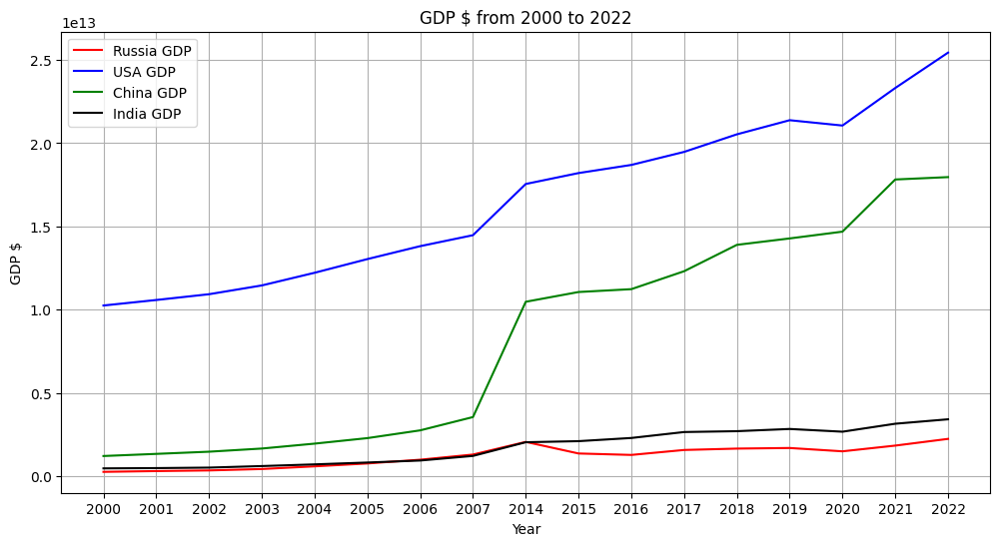

In [328]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(merged_data.index, merged_data['Russia GDP'], color='r', linestyle='-', label='Russia GDP')
plt.plot(merged_data.index, merged_data['USA GDP'], color='b', linestyle='-', label='USA GDP')
plt.plot(merged_data.index, merged_data['China GDP'], color='g', linestyle='-', label='China GDP')
plt.plot(merged_data.index, merged_data['India GDP'], color='black', linestyle='-', label='India GDP')
plt.title('GDP $ from 2000 to 2022')
plt.xlabel('Year')
plt.ylabel('GDP $')
plt.grid(True)
plt.legend(loc='best')
plt.show()




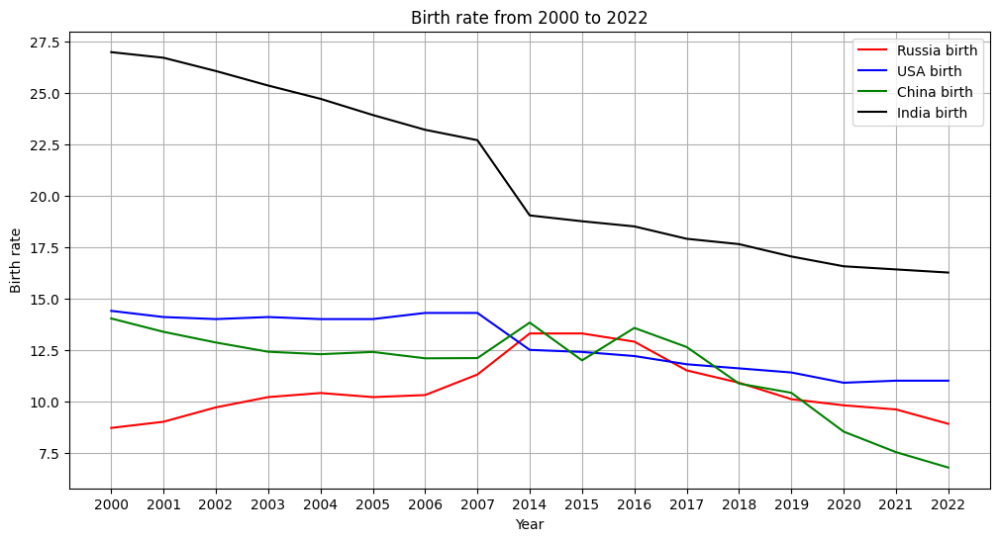

In [329]:
plt.figure(figsize=(12, 6))
plt.plot(merged_data.index, merged_data['Russia birth rate'], color='r', linestyle='-', label='Russia birth')
plt.plot(merged_data.index, merged_data['USA birth rate'], color='b', linestyle='-', label='USA birth')
plt.plot(merged_data.index, merged_data['China birth rate'], color='g', linestyle='-', label='China birth')
plt.plot(merged_data.index, merged_data['India birth rate'], color='black', linestyle='-', label='India birth')

plt.title('Birth rate from 2000 to 2022')
plt.xlabel('Year')
plt.ylabel('Birth rate')
plt.grid(True)
plt.legend(loc='best')

plt.show()

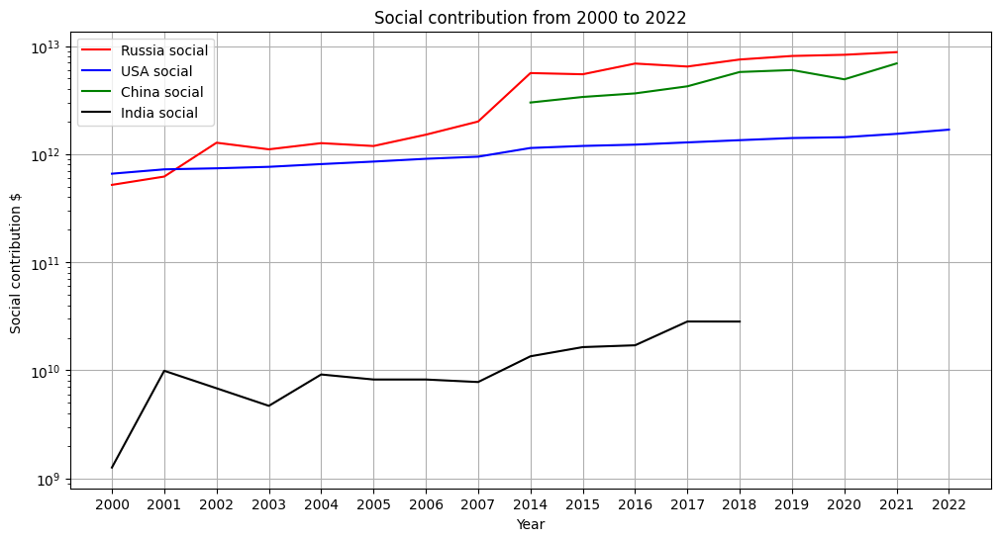

In [330]:
plt.figure(figsize=(12, 6))
plt.plot(merged_data.index, merged_data['Russia social'], color='r', linestyle='-', label='Russia social')
plt.plot(merged_data.index, merged_data['USA social'], color='b', linestyle='-', label='USA social')
plt.plot(merged_data.index, merged_data['China social'], color='g', linestyle='-', label='China social')
plt.plot(merged_data.index, merged_data['India social'], color='black', linestyle='-', label='India social')

plt.title('Social contribution from 2000 to 2022')
plt.xlabel('Year')
plt.ylabel('Social contribution $ ')
plt.grid(True)
plt.legend(loc='best')
plt.yscale('log') # значения социальных отчислений Индии слишком малы, чтобы отобразить на графике

plt.show()

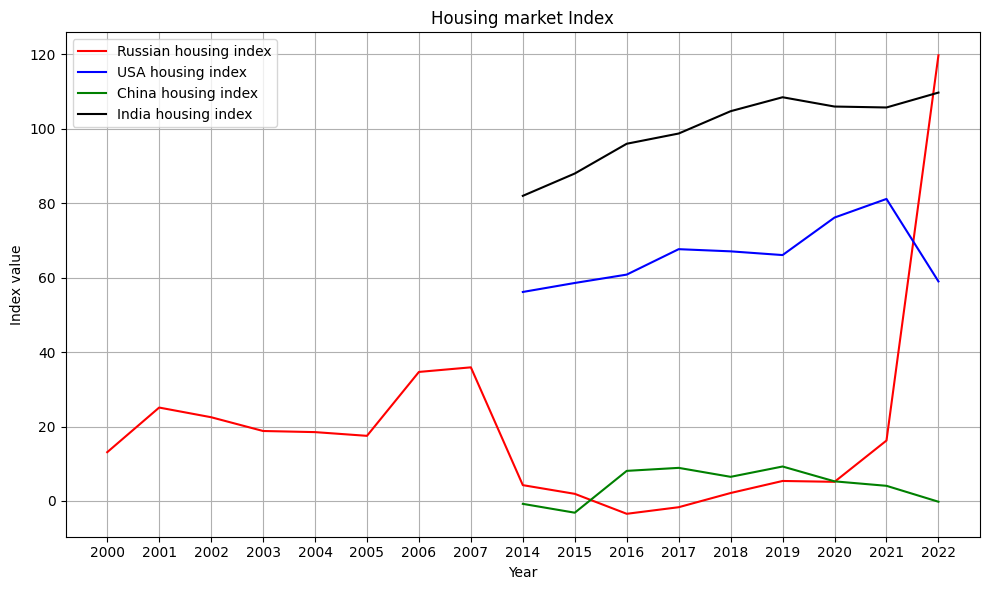

In [331]:
plt.figure(figsize=(10, 6))
plt.plot(merged_data.index, merged_data['Russia_Value'], color='r', linestyle='-', label = 'Russian housing index')
plt.plot(merged_data.index, merged_data['USA_Value'], color='b', linestyle='-', label = 'USA housing index')
plt.plot(merged_data.index, merged_data['China_Value'], color='green', linestyle='-', label = 'China housing index')
plt.plot(merged_data.index, merged_data['India_Value'], color='black', linestyle='-', label = 'India housing index')

plt.title('Housing market Index')
plt.xlabel('Year')
plt.ylabel('Index value')
plt.legend(loc='best')
plt.tight_layout()
plt.grid(True)
plt.show()


In [332]:
header = "Часть 4. Корреляционный анализ"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"

print(formatted_header)


Часть 4. Корреляционный анализ


In [333]:
Russia_birth_GDP_correlation = merged_data['Russia birth rate'].corr(merged_data['Russia GDP'])
Russia_birth_social_correlation = merged_data['Russia birth rate'].corr(merged_data['Russia social'])
Russia_birth_housing_correlation = merged_data['Russia birth rate'].corr(merged_data['Russia_Value'])

print(f"Корреляция между рождаемостью и ВВП для России: {Russia_birth_GDP_correlation}")
print(f"Корреляция между рождаемостью и социальными отчислениями для России: {Russia_birth_social_correlation}")
print(f"Корреляция между рождаемостью и рынком недвижимости для России: {Russia_birth_housing_correlation}")


Корреляция между рождаемостью и ВВП для России: 0.3541894735812708
Корреляция между рождаемостью и социальными отчислениями для России: 0.3564189528859735
Корреляция между рождаемостью и рынком недвижимости для России: -0.46559992753105484


In [334]:
USA_birth_GDP_correlation = merged_data['USA birth rate'].corr(merged_data['USA GDP'])
USA_birth_social_correlation = merged_data['USA birth rate'].corr(merged_data['USA social'])
USA_birth_housing_correlation = merged_data['USA birth rate'].corr(merged_data['USA_Value'])

print(f"Корреляция между рождаемостью и ВВП для США: {USA_birth_GDP_correlation}")
print(f"Корреляция между рождаемостью и социальными отчислениями для США: {USA_birth_social_correlation}")
print(f"Корреляция между рождаемостью и рынком недвижимости для США: {USA_birth_housing_correlation}")


Корреляция между рождаемостью и ВВП для США: -0.9552642570320409
Корреляция между рождаемостью и социальными отчислениями для США: -0.9614894274955861
Корреляция между рождаемостью и рынком недвижимости для США: -0.7078481564400485


In [335]:
China_birth_GDP_correlation = merged_data['China birth rate'].corr(merged_data['China GDP'])
China_birth_social_correlation = merged_data['China birth rate'].corr(merged_data['China social'])
China_birth_housing_correlation = merged_data['China birth rate'].corr(merged_data['China_Value'])

print(f"Корреляция между рождаемостью и ВВП для Китая: {China_birth_GDP_correlation}")
print(f"Корреляция между рождаемостью и социальными отчислениями для Китая: {China_birth_social_correlation}")
print(f"Корреляция между рождаемостью и рынком недвижимости для Китая: {China_birth_housing_correlation}")

Корреляция между рождаемостью и ВВП для Китая: -0.7213568387832163
Корреляция между рождаемостью и социальными отчислениями для Китая: -0.8381504421969329
Корреляция между рождаемостью и рынком недвижимости для Китая: 0.09981422224189224


In [336]:
India_birth_GDP_correlation = merged_data['India birth rate'].corr(merged_data['India GDP'])
India_birth_social_correlation = merged_data['India birth rate'].corr(merged_data['India social'])
India_birth_housing_correlation = merged_data['India birth rate'].corr(merged_data['India_Value'])

print(f"Корреляция между рождаемостью и ВВП для Индии: {India_birth_GDP_correlation}")
print(f"Корреляция между рождаемостью и социальными отчислениями для Индии: {India_birth_social_correlation}")
print(f"Корреляция между рождаемостью и рынком недвижимости для Индии: {India_birth_housing_correlation}")

Корреляция между рождаемостью и ВВП для Индии: -0.9818833239421643
Корреляция между рождаемостью и социальными отчислениями для Индии: -0.8617204035564502
Корреляция между рождаемостью и рынком недвижимости для Индии: -0.9144502316211496


In [337]:
header = "Часть 5. Связь между переменными"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"

print(formatted_header)


Часть 5. Связь между переменными


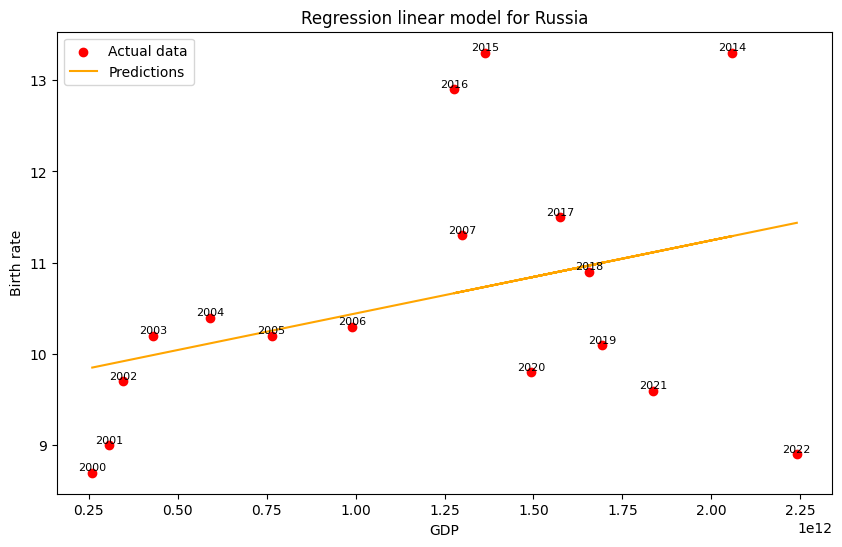

R^2: 0.12545018319577772
P_Values: 0.1630654122
MAE: 1.0015551499555628


In [338]:
X = merged_data['Russia GDP'].values.reshape(-1, 1)
y = merged_data['Russia birth rate'].values

model = LinearRegression()
model.fit(X, y)
y_pred = model.predict(X)

plt.figure(figsize=(10,6)) 
plt.scatter(X[:, 0], y, color='red', label='Actual data')
plt.plot(X[:, 0], y_pred, color='orange', label='Predictions')
r2 = r2_score(y, y_pred)
plt.xlabel('GDP')
plt.ylabel('Birth rate')
plt.title('Regression linear model for Russia')
plt.legend(loc='best')
for i, date in enumerate(merged_data.index):
    plt.text(X[i, 0], y[i], date, fontsize=8, ha='center', va='bottom')

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(y, y_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [339]:
print("Краткий вывод: модель плохо объясняет изменчивость данных, плохо показывает точность в прогнозировании. Согласно тесту, модель не является значимой.")

Краткий вывод: модель плохо объясняет изменчивость данных, плохо показывает точность в прогнозировании. Согласно тесту, модель не является значимой.


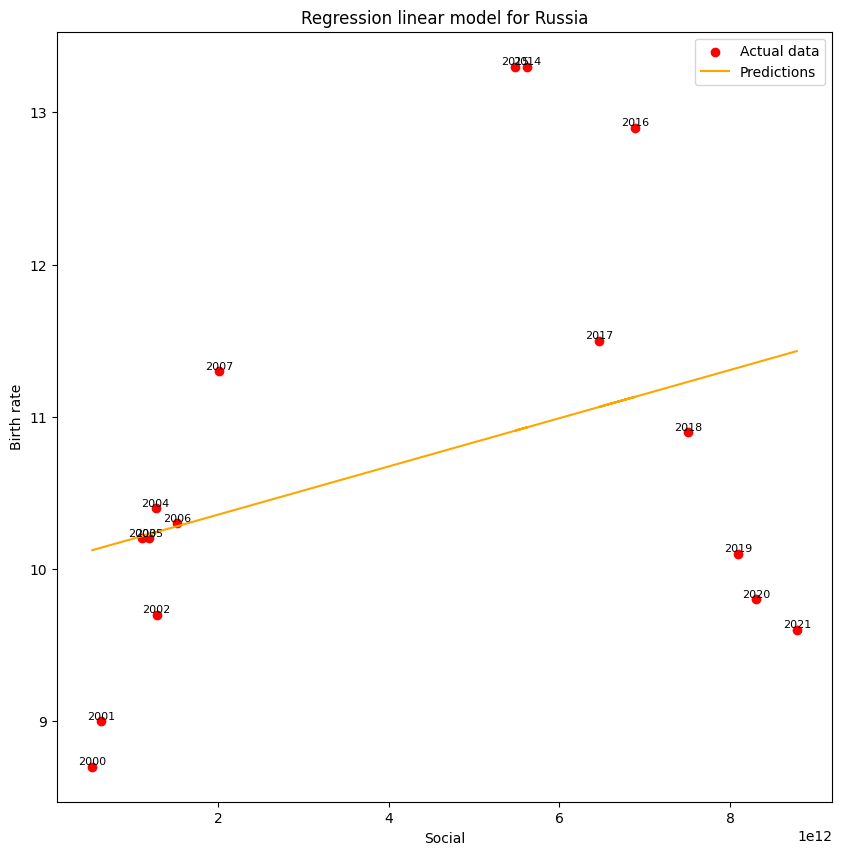

R^2: 0.12703446997633394
P_Values: 0.1754063746
MAE: 1.0108541121861965


In [340]:
merged_data_cleaned = merged_data.dropna(subset=['Russia social'], inplace=False)
a = merged_data_cleaned['Russia social'].values.reshape(-1, 1)
b = merged_data_cleaned['Russia birth rate'].values

model = LinearRegression()
model.fit(a, b)
b_pred = model.predict(a)


plt.figure(figsize=(10,10))
plt.scatter(a, b, color='red', label='Actual data')
plt.plot(a, b_pred, color='orange', label='Predictions')
r2 = r2_score(b, b_pred)

plt.xlabel('Social')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for Russia')
for i, date in enumerate(merged_data_cleaned.index):
    plt.text(a[i, 0], b[i], date, fontsize=8, ha='center', va='bottom')

a = sm.add_constant(a)
model = sm.OLS(b, a).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(b, b_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [341]:
print("Краткий вывод: модель плохо объясняет изменчивость данных, плохо показывает точность в прогнозировании. Согласно тесту, модель не является значимой.")

Краткий вывод: модель плохо объясняет изменчивость данных, плохо показывает точность в прогнозировании. Согласно тесту, модель не является значимой.


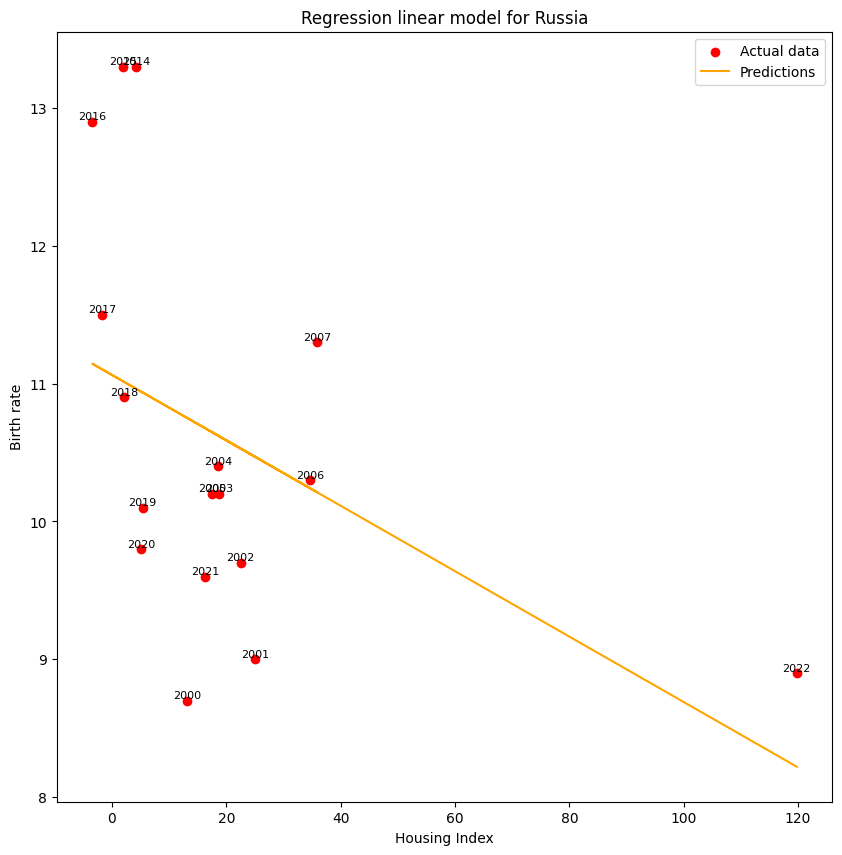

R^2: 0.21678329251692352
P_Values: 0.0596
MAE: 1.0120323927491077


In [342]:
c = merged_data['Russia_Value'].values.reshape(-1, 1)
d = merged_data['Russia birth rate'].values

model = LinearRegression()
model.fit(c, d)
d_pred = model.predict(c)

plt.figure(figsize=(10,10))
plt.scatter(c, d, color='red', label='Actual data')
plt.plot(c, d_pred, color='orange', label='Predictions')
r2 = r2_score(d, d_pred)
plt.xlabel('Housing Index')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for Russia')
for i, date in enumerate(merged_data.index):
    plt.text(c[i, 0], d[i], date, fontsize=8, ha='center', va='bottom')


c = sm.add_constant(c)
model = sm.OLS(d,c).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=4) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(d, d_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [343]:
print("Промежуточный вывод по России: на таком объёме данных не подтверждается зависимость между рождаемостью и независимыми переменными.")

Промежуточный вывод по России: на таком объёме данных не подтверждается зависимость между рождаемостью и независимыми переменными.


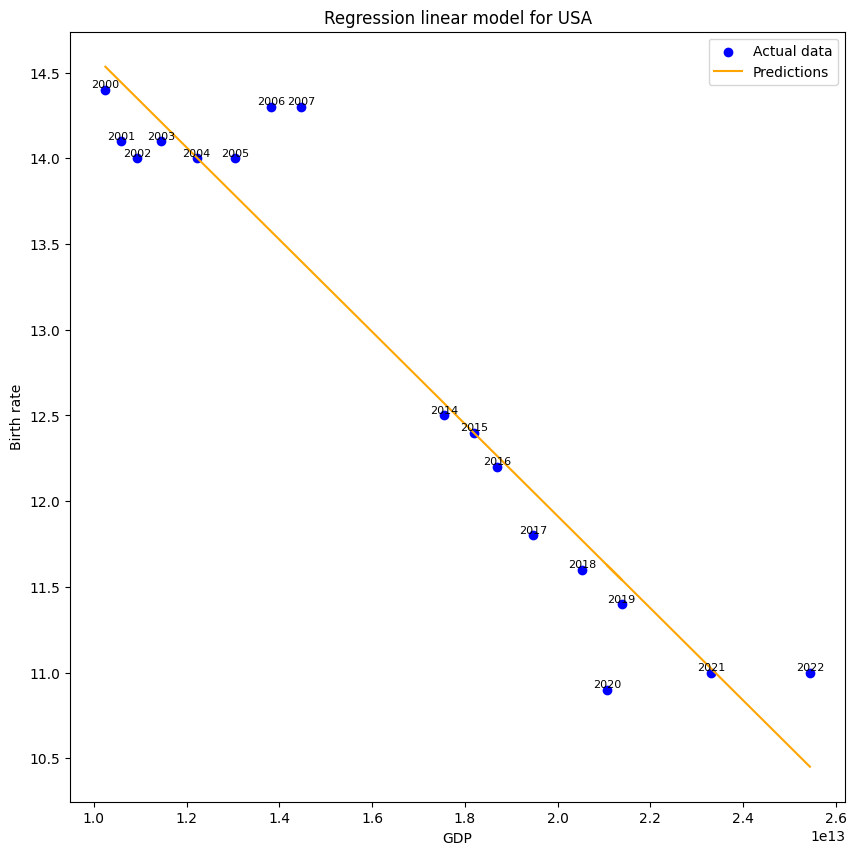

R^2: 0.912529800762977
P_Values: 0.0000000024
MAE: 0.28183398234817386


In [344]:
e = merged_data['USA GDP'].values.reshape(-1, 1)
f = merged_data['USA birth rate'].values


model = LinearRegression()
model.fit(e,f)
f_pred = model.predict(e)

plt.figure(figsize=(10,10))
plt.scatter(e, f, color='blue', label='Actual data')
plt.plot(e, f_pred, color='orange', label='Predictions')
r2 = r2_score(f, f_pred)

plt.xlabel('GDP')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for USA')
for i, date in enumerate(merged_data.index):
    plt.text(e[i, 0], f[i], date, fontsize=8, ha='center', va='bottom')
e = sm.add_constant(e)
model = sm.OLS(f, e).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(f, f_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [345]:
print("Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.")

Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.


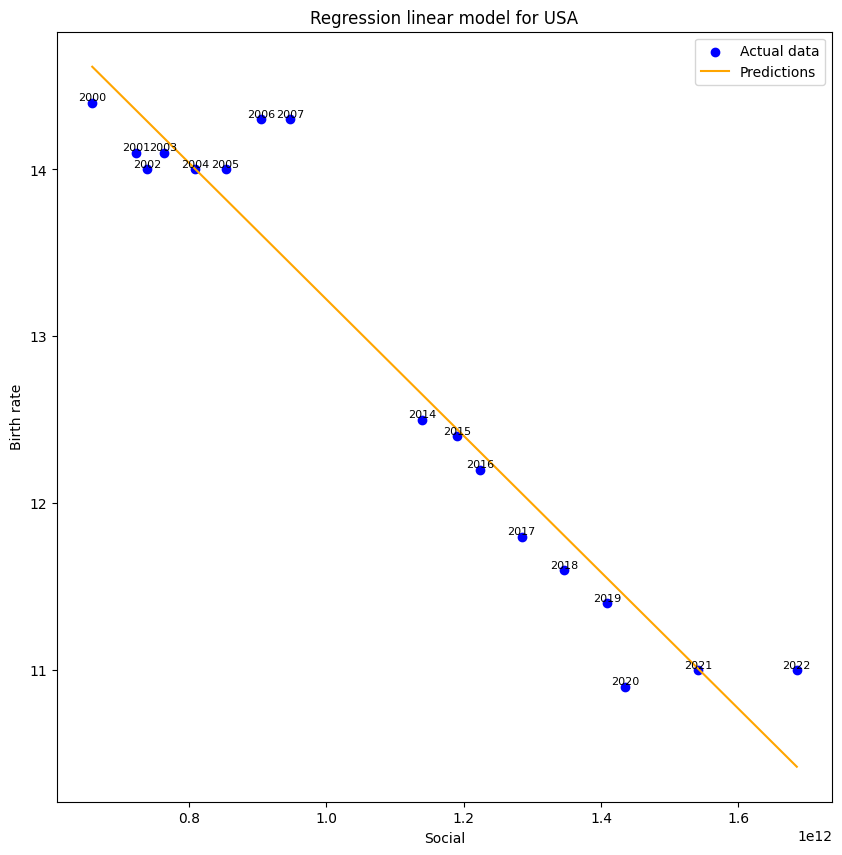

R^2: 0.92446191918579
P_Values: 0.0000000008
MAE: 0.27201166064912363


In [346]:
g = merged_data['USA social'].values.reshape(-1, 1)
h = merged_data['USA birth rate'].values


model = LinearRegression()
model.fit(g, h)
h_pred = model.predict(g)

plt.figure(figsize=(10,10))
plt.scatter(g, h, color='blue', label='Actual data')
plt.plot(g, h_pred, color='orange', label='Predictions')
r2 = r2_score(h, h_pred)

plt.xlabel('Social')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for USA')
for i, date in enumerate(merged_data.index):
    plt.text(g[i, 0], h[i], date, fontsize=8, ha='center', va='bottom')

g = sm.add_constant(g)
model = sm.OLS(h, g).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(h, h_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [347]:
print("Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.")

Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.


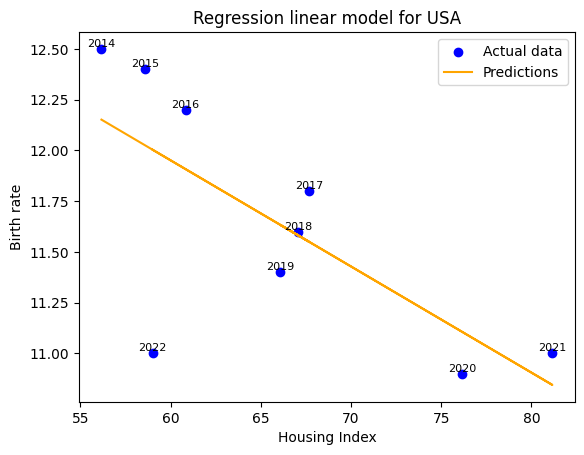

R^2: 0.5010490125755759
P_Values: 0.0328792107
MAE: 0.3203469995617405


In [348]:
merged_data_cleaned = merged_data
merged_data_cleaned = merged_data.dropna(subset=['USA_Value'], inplace=False)
i = merged_data_cleaned['USA_Value'].values.reshape(-1, 1)
j = merged_data_cleaned['USA birth rate'].values

model = LinearRegression()
model.fit(i, j)
j_pred = model.predict(i)

plt.scatter(i, j, color='blue', label='Actual data')
plt.plot(i, j_pred, color='orange', label='Predictions')
r2 = r2_score(j, j_pred)

plt.xlabel('Housing Index')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for USA')
for k, date in enumerate(merged_data_cleaned.index):
    plt.text(i[k, 0], j[k], date, fontsize=8, ha='center', va='bottom')

i = sm.add_constant(i)
model = sm.OLS(j, i).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(j, j_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [349]:
print("Промежуточный вывод по США: на предложенном объёме данных подтверждается зависимость между рождаемостью и независимыми переменными.")

Промежуточный вывод по США: на предложенном объёме данных подтверждается зависимость между рождаемостью и независимыми переменными.


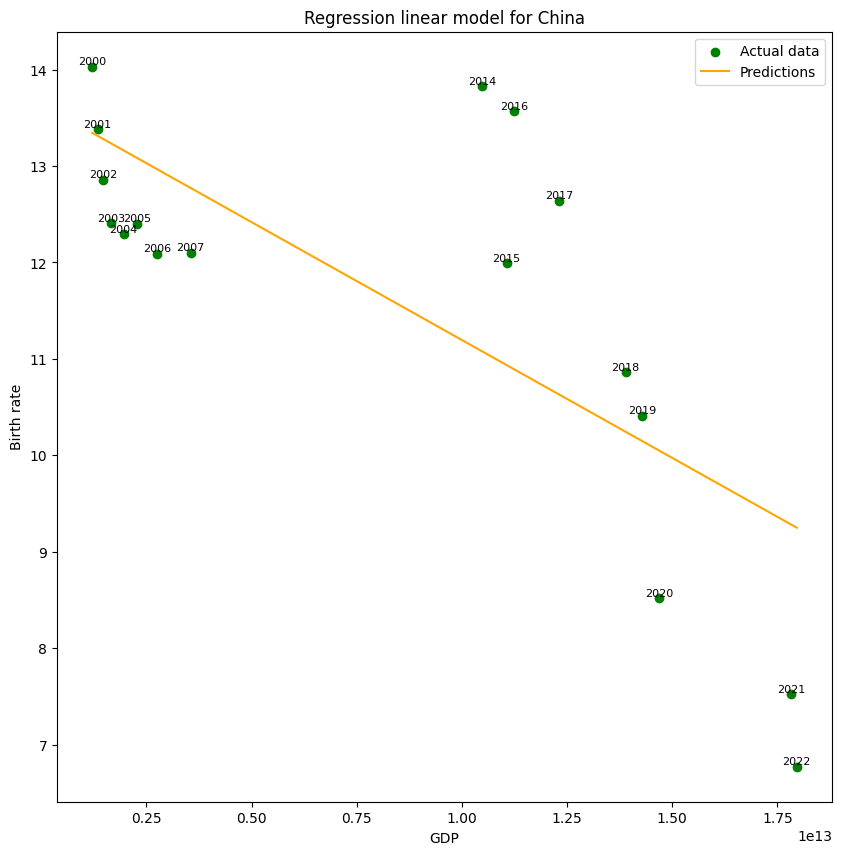

R^2: 0.5203556888593155
P_Values: 0.0010818888
MAE: 0.28183398234817386


In [350]:
k = merged_data['China GDP'].values.reshape(-1, 1)
l = merged_data['China birth rate'].values

model = LinearRegression()
model.fit(k, l)
l_pred = model.predict(k)


plt.figure(figsize=(10,10))
plt.scatter(k, l, color='green', label='Actual data')
plt.plot(k, l_pred, color='orange', label='Predictions')
r2 = r2_score(l, l_pred)

plt.xlabel('GDP')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for China')
for i, date in enumerate(merged_data.index):
    plt.text(k[i, 0], l[i], date, fontsize=8, ha='center', va='bottom')

k = sm.add_constant(k)
model = sm.OLS(l, k).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(f, f_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [351]:
print("Краткий вывод: модель объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.")

Краткий вывод: модель объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходит тест на значимость.


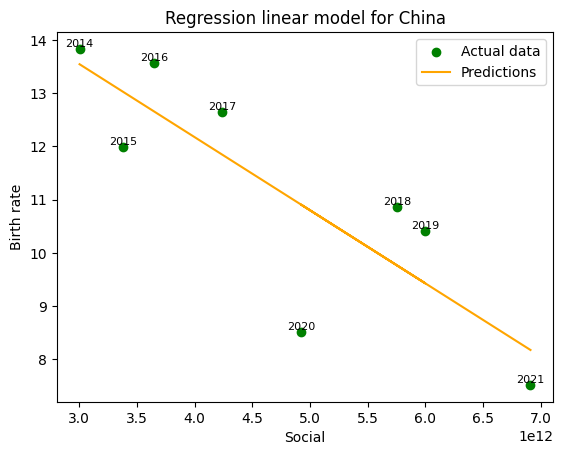

R^2: 0.7024961637549139
P_Values: 0.0093542722
MAE: 1.0191837675213784


In [352]:
merged_data_cleaned = merged_data
merged_data_cleaned = merged_data.dropna(subset=['China social'], inplace=False)
m = merged_data_cleaned['China social'].values.reshape(-1, 1)
n = merged_data_cleaned['China birth rate'].values


model = LinearRegression()
model.fit(m, n)
n_pred = model.predict(m)

plt.scatter(m, n, color='green', label='Actual data')
plt.plot(m, n_pred, color='orange', label='Predictions')
r2 = r2_score(n, n_pred)

plt.xlabel('Social')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for China')
for i, date in enumerate(merged_data_cleaned.index):
    plt.text(m[i, 0], n[i], date, fontsize=8, ha='center', va='bottom')

m = sm.add_constant(m)
model = sm.OLS(n, m).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(n, n_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [353]:
print("Краткий вывод: модель хорошо объясняет изменчивость данных, показывает слабую точность в прогнозировании. Модель проходить на значимость.")

Краткий вывод: модель хорошо объясняет изменчивость данных, показывает слабую точность в прогнозировании. Модель проходить на значимость.


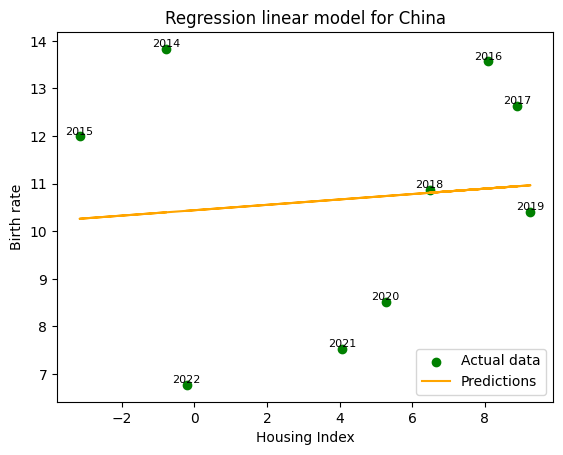

R^2: 0.009962878961753852
P_Values: 0.7983407851
MAE: 2.1294847485446344


In [354]:
merged_data_cleaned = merged_data
merged_data_cleaned = merged_data.dropna(subset=['China_Value'], inplace=False)
o = merged_data_cleaned['China_Value'].values.reshape(-1, 1)
p = merged_data_cleaned['China birth rate'].values

model = LinearRegression()
model.fit(o, p)
p_pred = model.predict(o)

plt.scatter(o, p, color='green', label='Actual data')
plt.plot(o, p_pred, color='orange', label='Predictions')
r2 = r2_score(p, p_pred)

plt.xlabel('Housing Index')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for China')
for i, date in enumerate(merged_data_cleaned.index):
    plt.text(o[i, 0], p[i], date, fontsize=8, ha='center', va='bottom')

o = sm.add_constant(o)
model = sm.OLS(p, o).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(p, p_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [355]:
print("Промежуточный вывод по Китаю: на предложенном объёме данных подтверждается зависимость между рождаемостью и ВВП, социальными отчислениями. Из-за ограниченности данных и больших выбросов, не подтверждается зависимость между рождаемостью и рынком недвижимости.")

Промежуточный вывод по Китаю: на предложенном объёме данных подтверждается зависимость между рождаемостью и ВВП, социальными отчислениями. Из-за ограниченности данных и больших выбросов, не подтверждается зависимость между рождаемостью и рынком недвижимости.


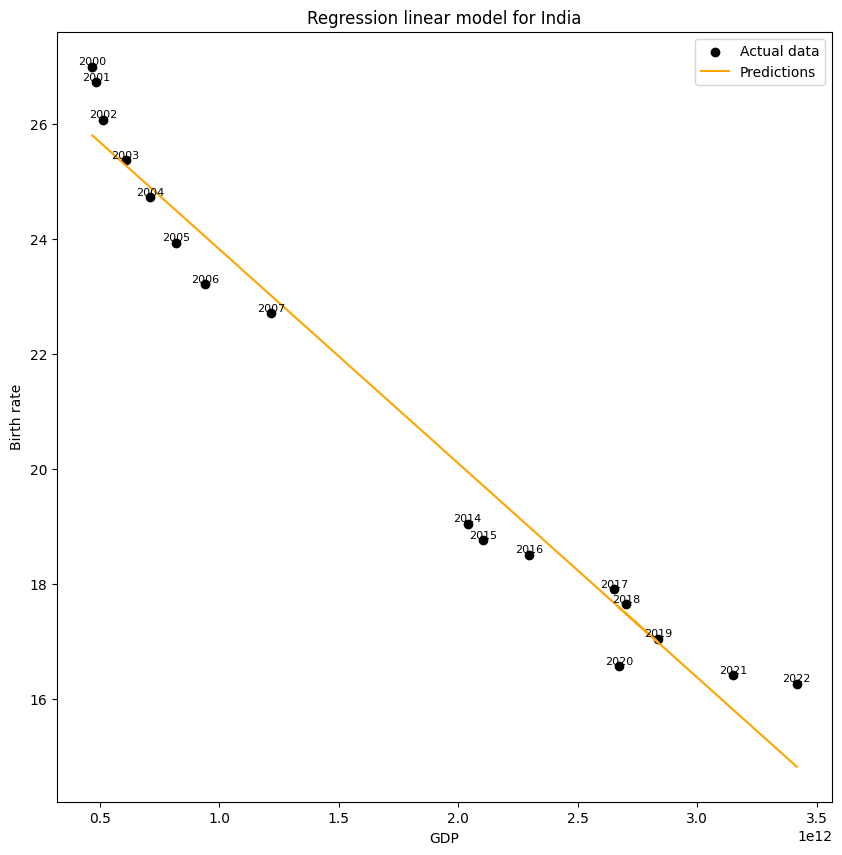

R^2: 0.964094861835713
P_Values: 0.0000000000
MAE: 0.6161568513326063


In [356]:
q = merged_data['India GDP'].values.reshape(-1, 1)
r = merged_data['India birth rate'].values

model = LinearRegression()
model.fit(q, r)
r_pred = model.predict(q)

plt.figure(figsize=(10,10))
plt.scatter(q, r, color='black', label='Actual data')
plt.plot(q, r_pred, color='orange', label='Predictions')
r2 = r2_score(r, r_pred)

plt.xlabel('GDP')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for India')
for i, date in enumerate(merged_data.index):
    plt.text(q[i, 0], r[i], date, fontsize=8, ha='center', va='bottom')

q = sm.add_constant(q)
model = sm.OLS(r, q).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(r, r_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [357]:
print("Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходить на значимость.")

Краткий вывод: модель хорошо объясняет изменчивость данных, показывает высокую точность в прогнозировании. Модель проходить на значимость.


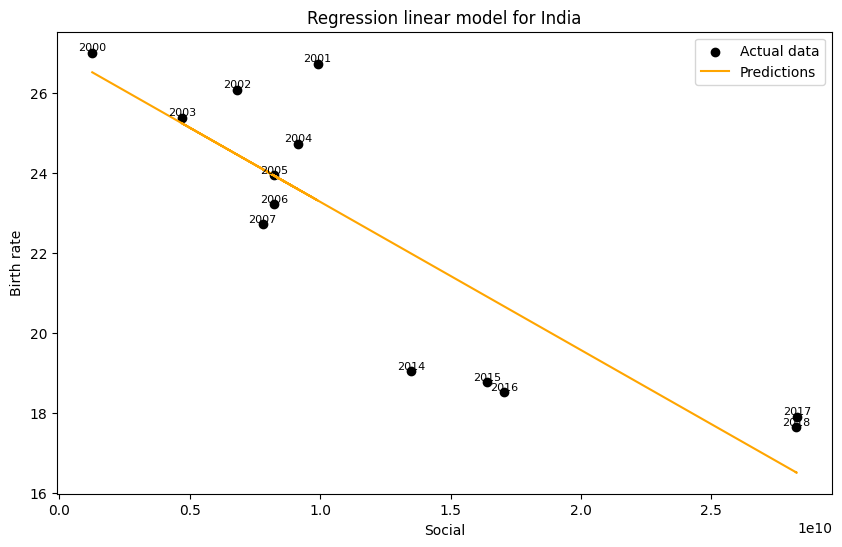

R^2: 0.7425620539054916
P_Values: 0.0001526617
MAE: 1.4366283157565563


In [358]:
merged_data_cleaned = merged_data
merged_data_cleaned = merged_data.dropna(subset=['India social'], inplace=False)
s = merged_data_cleaned['India social'].values.reshape(-1, 1)
t = merged_data_cleaned['India birth rate'].values

model = LinearRegression()
model.fit(s, t)
t_pred = model.predict(s)

plt.figure(figsize=(10,6))
plt.scatter(s, t, color='black', label='Actual data')
plt.plot(s, t_pred, color='orange', label='Predictions')
r2 = r2_score(t, t_pred)

plt.xlabel('Social')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for India')
for i, date in enumerate(merged_data_cleaned.index):
    plt.text(s[i, 0], t[i], date, fontsize=8, ha='center', va='bottom')

s = sm.add_constant(s)
model = sm.OLS(t, s).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(t, t_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [359]:
print("Краткий вывод: модель хорошо объясняет изменчивость данных, показывает средную точность в прогнозировании. Модель проходить на значимость.")

Краткий вывод: модель хорошо объясняет изменчивость данных, показывает средную точность в прогнозировании. Модель проходить на значимость.


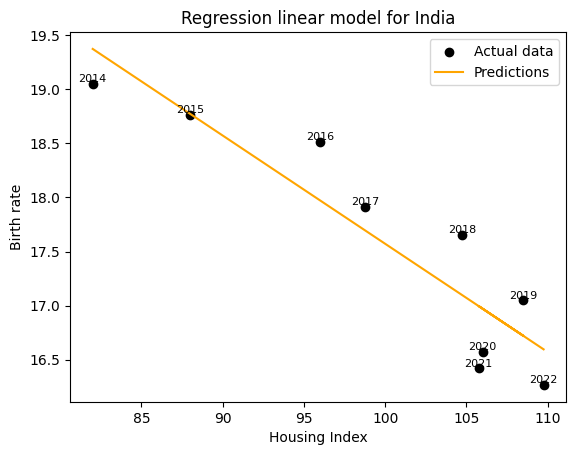

R^2: 0.8362192261119734
P_Values: 0.0005541366
MAE: 0.36404234502029453


In [360]:
merged_data_cleaned = merged_data
merged_data_cleaned = merged_data.dropna(subset=['India_Value'], inplace=False)
u = merged_data_cleaned['India_Value'].values.reshape(-1, 1)
v = merged_data_cleaned['India birth rate'].values

model = LinearRegression()
model.fit(u, v)
v_pred = model.predict(u)
r2 = r2_score(v, v_pred)

plt.scatter(u, v, color='black', label='Actual data')
plt.plot(u, v_pred, color='orange', label='Predictions')
plt.xlabel('Housing Index')
plt.ylabel('Birth rate')
plt.legend()
plt.title('Regression linear model for India')
for i, date in enumerate(merged_data_cleaned.index):
    plt.text(u[i, 0], v[i], date, fontsize=8, ha='center', va='bottom')

u = sm.add_constant(u)
model = sm.OLS(v, u).fit()
p_values = model.pvalues
p_values_formatted = np.array([np.format_float_positional(p, precision=10) for p in p_values])
p_values_formatted = p_values_formatted[1]

mae = mean_absolute_error(v, v_pred)

plt.show()
print("R^2:", r2)
print("P_Values:", p_values_formatted)
print("MAE:", mae)

In [361]:
print("Промежуточный вывод по Индии: на предложенном объёме данных подтверждается зависимость между рождаемостью и независимыми переменными.")

Промежуточный вывод по Индии: на предложенном объёме данных подтверждается зависимость между рождаемостью и независимыми переменными.


In [362]:
header = "Часть 6. Итоги"
formatted_header = f"{Fore.BLACK}{Style.BRIGHT}{header}{Style.RESET_ALL}"
print(formatted_header)
print("Гипотеза-1: в США, Китае и Индии явно прослеживается негативная зависимость между ростом ВВП и рождаемостью; для России наблюдается слабая положительная зависимость.\nГипотеза 2: подтверждена для США, Китая и Индии; в России снова наблюдается слабая положительная зависимость. \nГипотеза-3: действительно, рост цен на недвижимость негативно влияет на рождаемость в исследуемых странах. \nДля объяснения динамики рождаемости США, Китая и Индии можно использовать ВВП, социальные отчисления и рынок недвижимости. По результатам анализа и построенным моделям, учитывая ограниченность данных, на динамику рождаемости в России влияют другие переменные.")   

Часть 6. Итоги
Гипотеза-1: в США, Китае и Индии явно прослеживается негативная зависимость между ростом ВВП и рождаемостью; для России наблюдается слабая положительная зависимость.
Гипотеза 2: подтверждена для США, Китая и Индии; в России снова наблюдается слабая положительная зависимость. 
Гипотеза-3: действительно, рост цен на недвижимость негативно влияет на рождаемость в исследуемых странах. 
Для объяснения динамики рождаемости США, Китая и Индии можно использовать ВВП, социальные отчисления и рынок недвижимости. По результатам анализа и построенным моделям, учитывая ограниченность данных, на динамику рождаемости в России влияют другие переменные.


In [365]:
"""
В конце работы нашёл интересный инструмент pandas - pandas-profiling. Полезный интрумент для анализа больших объёмов данных.
Формурует расширенный целостный отчёт о данных, находя зависимости, строя графики рассеивания, графики распределения и т.д
"""
merged_data.to_csv('merged_data.csv', index=True)
merged_data = pd.read_csv('merged_data.csv')
profile = ProfileReport(merged_data)
profile.to_file("merged_data_profile.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [366]:
profile